In [ ]:
import importlib
import utils
importlib.reload(utils)
from sent_sampling.utils import extract_pool,model_grps_config
import utils.optim_utils
importlib.reload(utils.optim_utils)
from sent_sampling.utils.optim_utils import optim, optim_pool, pt_create_corr_rdm_short
from sent_sampling.utils.data_utils import load_obj, SAVE_DIR, UD_PARENT, RESULTS_DIR, LEX_PATH_SET, save_obj
import torch 
import numpy as np 
import matplotlib.pyplot as plt 
from scipy.spatial.distance import pdist, squareform
import matplotlib.cm as cm 
import scipy as sp
from tqdm import tqdm
import pandas as pd 
import scipy 
import re
import seaborn as sns 
import os 
ANALYZE_DIR='/om/user/ehoseini/MyData/sent_sampling/analysis/'
import tqdm.notebook as tq
from tqdm import tqdm_notebook
def normalized(a, axis=-1, order=2):
    l2 = np.atleast_1d(np.linalg.norm(a, order, axis))
    l2[l2==0] = 1
    return a / np.expand_dims(l2, axis)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Generating 2x retina plots 
%config InlineBackend.figure_format = 'retina'

# Set base figure size 
matplotlib.rc("figure", figsize=(5, 5))

In [2]:
mdl_name='gpt2-xl'
#mdl_name='bert-large-uncased-whole-word-masking'
#mdl_name='gpt2-large'

#group='roberta-base_layers' 
#group='xlnet-large-cased_layers' "

#group='xlm-mlm-en-2048_layers' "
#group='albert-xxlarge-v2_layers' "
#group='ctrl_layers' "

group=f'{mdl_name}_layers'
#dataset='coca_spok_filter_punct_10K_sample_1' 
dataset='ud_sentencez_token_filter_v3' 
activatiion_type='activation' 
average='None' 
extractor_id=f'group={group}-dataset={dataset}-{activatiion_type}-bench=None-ave={average}'
#extractor_id='group=xlm-mlm-en-2048_layers-dataset=coca_spok_filter_punct_10K_sample_1-activation-bench=None-ave=False'

extractor_obj = extract_pool[extractor_id]()
extractor_obj.load_dataset(silent=False)
model_layers = extractor_obj.layer_name
extractor_obj()
mdl_name=str(np.unique(extractor_obj.model_spec).squeeze())

loading /om/user/ehoseini/MyData/Universal Dependencies 2.6/ud_sentencez_data_token_filter_v3_no_dup.pkl


934it [00:00, 172272.64it/s]
934it [00:00, 130413.13it/s]
935it [00:00, 146599.16it/s]
934it [00:00, 176981.25it/s]
934it [00:00, 166128.66it/s]
935it [00:00, 187290.43it/s]
934it [00:00, 148114.48it/s]
934it [00:00, 203325.89it/s]
935it [00:00, 215051.23it/s]


extracting network activations for gpt2-xl
ud_sentencez_token_filter_v3_gpt2-xl_layer_0_activation_ave_None.pkl already exists, loading...
loading /om/user/ehoseini/MyData/sent_sampling/ud_sentencez_token_filter_v3_gpt2-xl_layer_0_activation_ave_None.pkl
adding activations to set
extracting network activations for gpt2-xl
ud_sentencez_token_filter_v3_gpt2-xl_layer_1_activation_ave_None.pkl already exists, loading...
loading /om/user/ehoseini/MyData/sent_sampling/ud_sentencez_token_filter_v3_gpt2-xl_layer_1_activation_ave_None.pkl
adding activations to set
extracting network activations for gpt2-xl
ud_sentencez_token_filter_v3_gpt2-xl_layer_2_activation_ave_None.pkl already exists, loading...
loading /om/user/ehoseini/MyData/sent_sampling/ud_sentencez_token_filter_v3_gpt2-xl_layer_2_activation_ave_None.pkl
adding activations to set
extracting network activations for gpt2-xl
ud_sentencez_token_filter_v3_gpt2-xl_layer_3_activation_ave_None.pkl already exists, loading...
loading /om/user/e

In [3]:
#extractor_obj.data_[0]['surprisal_3']

tot_surprise=[]
tot_surprise_ave=[]
tot_sent_with_period=[]
for x in extractor_obj.data_:
    tot_surprise.append(x['surprisal_3']) 
    tot_surprise_ave.append(np.nanmean(x['surprisal_3'][1:]))
    sent=' '.join(x['word_FORM'])
    tot_sent_with_period.append(sent+'.')

In [4]:
optimizer_id='coordinate_ascent_eh-obj=D_s_var-n_iter=50-n_samples=25-n_init=1-run_gpu=True'
optim_obj=optim_pool[optimizer_id]()

In [5]:
extractor_obj.model_group_act[1]['layer']

1

In [6]:
all_layer_curve=[]
all_layer_curve_all=[]
all_layer_curve_rnd=[]
all_layer_curve_rnd_all=[]
for idk,layer_act in  tqdm_notebook(enumerate(extractor_obj.model_group_act)):
    sent_act_list=layer_act['activations']
    #sent_act=[torch.tensor(x[0], dtype=float, device=optim_obj.device, requires_grad=False) for x in sent_act_list]
    sent_act=[x[0] for x in sent_act_list]
    sent_act=[np.diff(x,axis=0) for x in sent_act]
    
    sent_act=[normalized(x) for x in sent_act]
    curvature=[]
    for idy , vec in (enumerate(sent_act)):
        curve=[np.dot(vec[idx,:],vec[idx+1,:]) for idx in range(vec.shape[0]-1)]
        curvature.append(np.arccos(curve))
    all_layer_curve.append([np.mean(x) for x in curvature])
    all_layer_curve_all.append(curvature)
    
    # create a permuted version of the sentence 
#     sent_rand=[x[0] for x in sent_act_list]
#     sent_rand=[x[np.random.permutation(x.shape[0]),:] for x in sent_rand]
#     sent_rand=[normalized(x) for x in sent_rand]
#     curvature_rnd=[]
#     for idy , vec in tqdm(enumerate(sent_rand)):
#         curve_rnd=[np.arccos(np.dot(vec[idx,:],vec[idx+1,:])) for idx in range(vec.shape[0]-1)]
#         curvature_rnd.append(curve_rnd)
#     all_layer_curve_rnd.append([np.mean(x) for x in curvature_rnd])
#     all_layer_curve_rnd_all.append(curvature_rnd)


/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


0it [00:00, ?it/s]

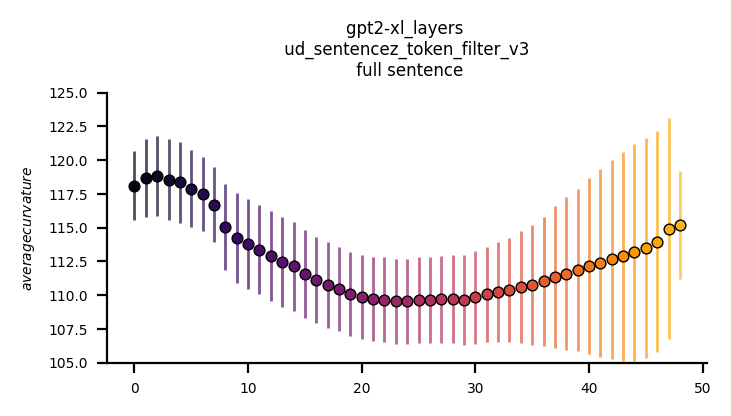

In [9]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
if bool(re.findall(r'-untrained', mdl_name)):
    line_cols=line_cols*0+(.6)
ax=plt.axes((.1,.1,.75,.45))
for i in range(len(all_layer_curve)):
    curv=all_layer_curve[i]
    ax.scatter(i,np.mean(curv)*180/np.pi,s=15,color=line_cols[i,:],zorder=2,edgecolor=(0,0,0),linewidth=.5,alpha=1)
    ax.errorbar(i,np.mean(curv)*180/np.pi,yerr=np.std(curv)*180/np.pi,linewidth=0,elinewidth=1, color=line_cols[i,:],zorder=0,alpha=.7)

    
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
     #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
ax.spines['right'].set_visible(False)
ax.set_ylim((105,125))
ax.spines['top'].set_visible(False)#  
ax.set_ylabel('$average curvature$')
ax.set_title(f"{group} \n {dataset} \n full sentence")
fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_{group}_{dataset}.pdf'),transparent=True)

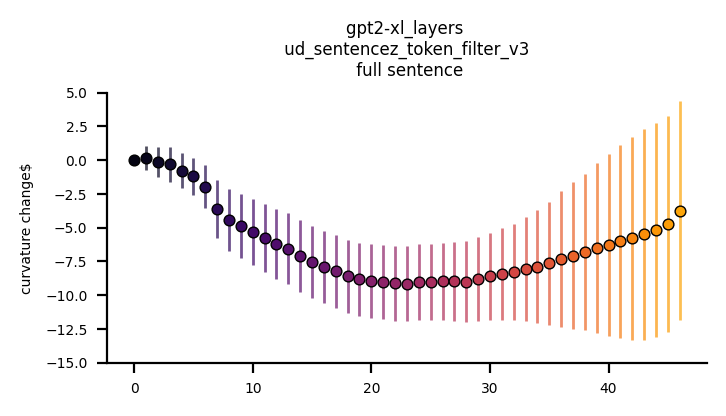

In [10]:
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
curve_change=(np.stack(all_layer_curve)[1:-1,:]-np.stack(all_layer_curve)[1,:])
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
if bool(re.findall(r'-untrained', mdl_name)):
    line_cols=line_cols*0+(.6)
ax=plt.axes((.1,.1,.75,.45))
for i in range(len(curve_change)):
    curv=curve_change[i]
    ax.scatter(i,np.mean(curv)*180/np.pi,s=15,color=line_cols[i,:],zorder=2,edgecolor=(0,0,0),linewidth=.5,alpha=1)
    ax.errorbar(i,np.mean(curv)*180/np.pi,yerr=np.std(curv)*180/np.pi,linewidth=0,elinewidth=1, color=line_cols[i,:],zorder=0,alpha=.7)

    
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
     #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)#  
ax.set_ylim((-15,5))
ax.set_ylabel(f'curvature change$')
ax.set_title(f"{group} \n {dataset} \n full sentence")
fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_change_{group}_{dataset}.pdf'),transparent=True)

In [12]:
7*7

49

49

/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


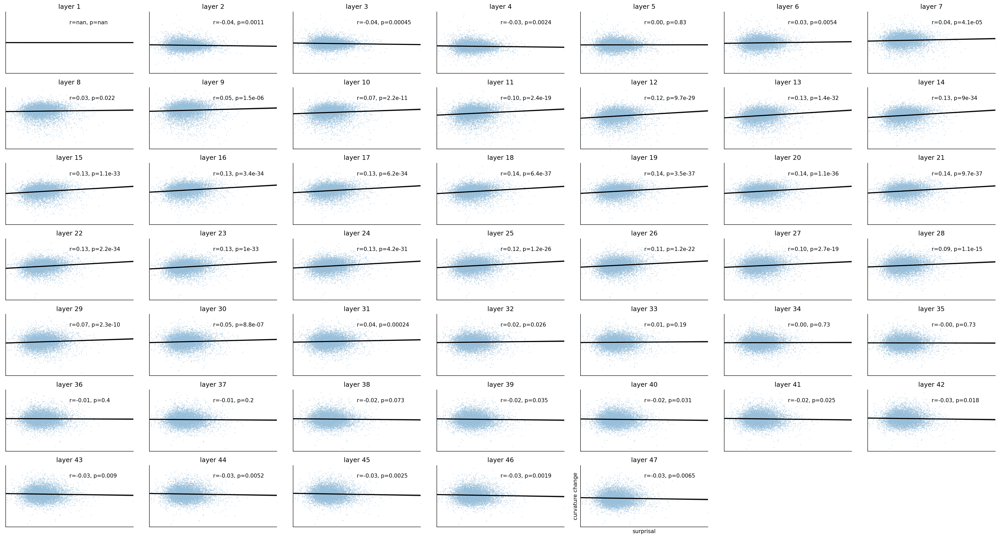

In [208]:
import matplotlib
matplotlib.rcParams['font.size'] = 10
fig=plt.figure(figsize=(26,14),dpi=75,frameon=False)
curve_change=list(np.stack(all_layer_curve)[1:-1,:]-np.stack(all_layer_curve)[1,:])
for i in range(len(curve_change)):
    curv=curve_change[i]
    ax=plt.subplot(7,7,i+1)
    #ax.scatter(tot_surprise_ave,curv,s=5,color=(0,0,1),zorder=4,edgecolor=(1,1,1),linewidth=.5,alpha=.5)
    ax = sns.regplot(x=tot_surprise_ave, y=curv, scatter_kws={"s": 3,"alpha":.2,"edgecolor":(1,1,1),"linewidth":.5},line_kws={"lw":2,'color':'k'})
    r, p = sp.stats.pearsonr(tot_surprise_ave, curv)
    ax = plt.gca()
    ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes,fontsize=10)
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)#  
    ax.set_yticks([])
    ax.set_title(f"layer {i+1}")
    #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
    ax.tick_params(
                    axis='both',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False) 
    if i==len(curve_change)-1:
        ax.set_xlabel('surprisal')
        ax.set_ylabel('curvature change')
    
plt.tight_layout()
fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_chang_vs_surprisal_{group}_{dataset}.pdf'),transparent=True)

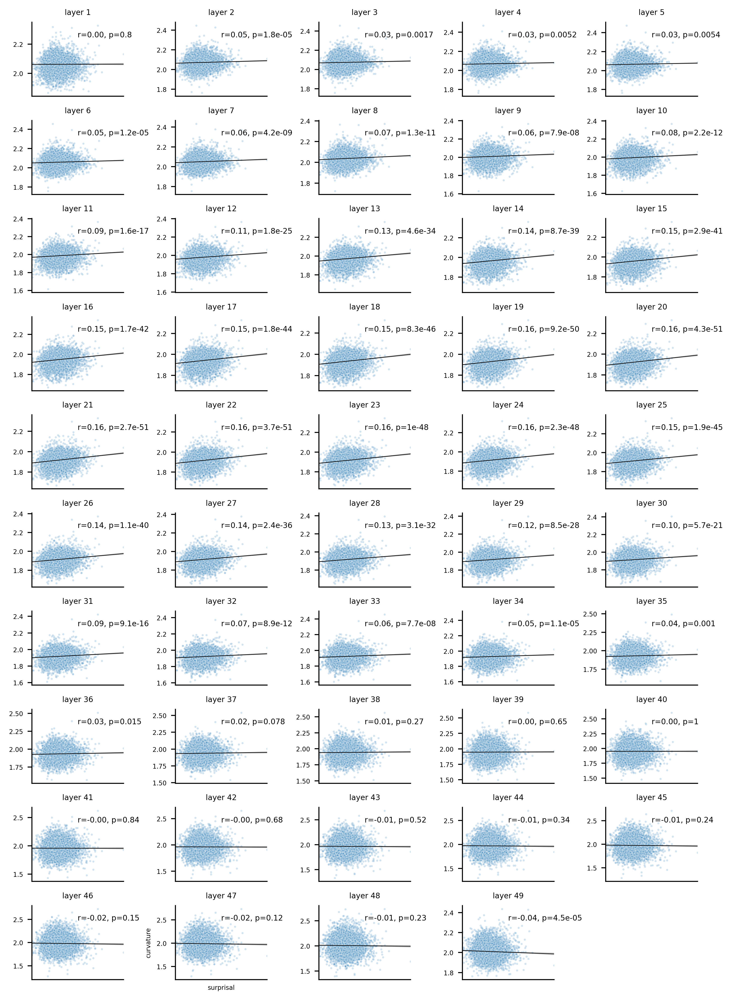

In [209]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(8,11),dpi=200,frameon=False)
for i in range(len(all_layer_curve)):
    curv=all_layer_curve[i]
    ax=plt.subplot(10,5,i+1)
    #ax.scatter(tot_surprise_ave,curv,s=5,color=(0,0,1),zorder=4,edgecolor=(1,1,1),linewidth=.5,alpha=.5)
    ax = sns.regplot(x=tot_surprise_ave, y=curv, scatter_kws={"s": 3,"alpha":.2,"edgecolor":(1,1,1),"linewidth":.5},line_kws={"lw":.5,'color':'k'})
    r, p = sp.stats.pearsonr(tot_surprise_ave, curv)
    ax = plt.gca()
    ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes,fontsize=6)
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)#  
    #ax.set_yticks([])
    ax.set_title(f"layer {i+1}")
    #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
    ax.tick_params(
                    axis='both',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False) 
    if i==len(curve_change)-1:
        ax.set_xlabel('surprisal')
        ax.set_ylabel('curvature')
    
plt.tight_layout()
fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_vs_surprisal_{group}_{dataset}.pdf'),transparent=True)

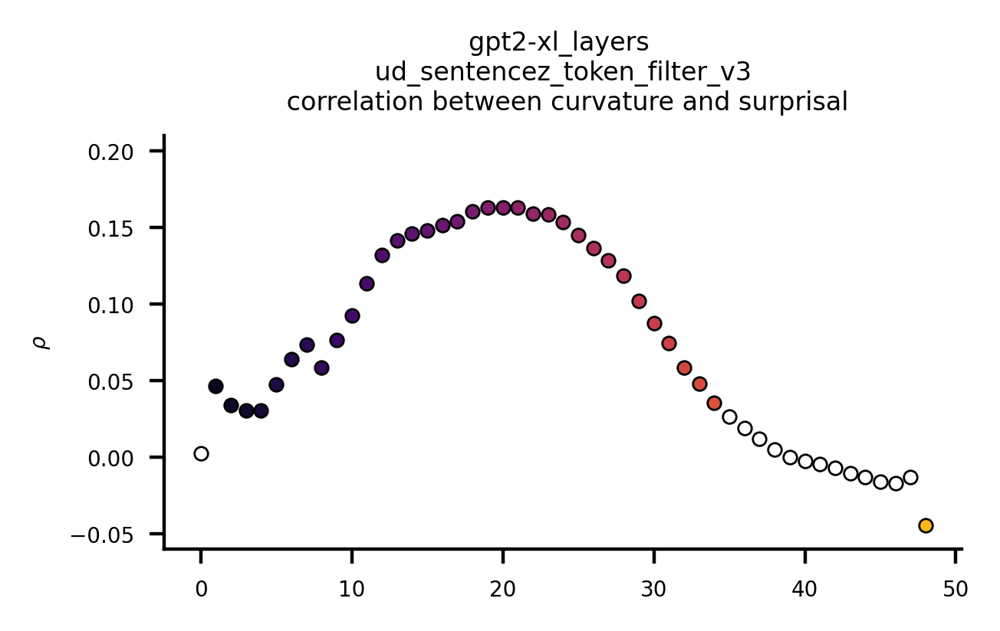

In [210]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
if bool(re.findall(r'-untrained', mdl_name)):
    line_cols=line_cols*0+(.6)
ax=plt.axes((.1,.1,.65,.45))
for i in range(len(all_layer_curve)):
    curv=all_layer_curve[i]
    r, p = sp.stats.pearsonr(tot_surprise_ave, curv)
    #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
    #        transform=ax.transAxes,fontsize=6)
    if p<1e-2:
        ax.scatter(i,r,s=10,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5,alpha=1)
    else:
        ax.scatter(i,r,s=10,color=(1,1,1),zorder=4,edgecolor=(0,0,0),linewidth=.5)
    
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
     #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False)
ax.set_ylim((-.06,.21))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)#  
ax.set_ylabel(r'$\rho$')
ax.set_title(f"{group} \n {dataset} \n correlation between curvature and surprisal")
fig.savefig(os.path.join(ANALYZE_DIR,f'correlation_curvature_vs_surprisal_{group}_{dataset}.pdf'),transparent=True)

In [87]:
all_layer_curve=[]
all_layer_curve_all=[]
all_layer_curve_rnd=[]
all_layer_curve_rnd_all=[]
long_k=15
for layer_act in extractor_obj.model_group_act:
    sent_act_list=layer_act['activations']
    #sent_act=[torch.tensor(x[0], dtype=float, device=optim_obj.device, requires_grad=False) for x in sent_act_list]
    sent_act=[x[0] for x in sent_act_list]
    sent_str=[x[1] for x in sent_act_list]
    # longer sentences 
    long_sent=np.where(np.asarray([x.shape[0] for x in sent_act])>long_k)[0]
    sent_long=[sent_act[x] for x in long_sent]
    sent_long=[np.diff(x,axis=0) for x in sent_long]
    long_sent_str=[sent_str[x] for x in long_sent]
    sent_long=[normalized(x) for x in sent_long]
    curvature=[]
    for idy , vec in tqdm(enumerate(sent_long)):
        curve=[np.arccos(np.dot(vec[idx,:],vec[idx+1,:])) for idx in range(vec.shape[0]-1)]
        curvature.append(curve)
    all_layer_curve.append([np.mean(x) for x in curvature])
    all_layer_curve_all.append(curvature)
    
    # create a permuted version of the sentence 
#     sent_rand=[x[0] for x in sent_act_list]
#     sent_rand_long=[sent_rand[x] for x in long_sent]
#     sent_rand_long=[x[np.random.permutation(x.shape[0]),:] for x in sent_rand_long]
#     sent_rand_long=[normalized(x) for x in sent_rand_long]
#     curvature_rnd=[]
#     for idy , vec in tqdm(enumerate(sent_rand_long)):
#         curve_rnd=[np.arccos(np.dot(vec[idx,:],vec[idx+1,:])) for idx in range(vec.shape[0]-1)]
#         curvature_rnd.append(curve_rnd)
#     all_layer_curve_rnd.append([np.mean(x) for x in curvature_rnd])
#     all_layer_curve_rnd_all.append(curvature_rnd)



1595it [00:00, 6675.26it/s]
1595it [00:00, 9486.97it/s] 
1595it [00:00, 13669.35it/s]
1595it [00:00, 3749.21it/s] 
1595it [00:00, 6357.40it/s]
1595it [00:00, 11088.54it/s]
1595it [00:00, 5662.75it/s]
1595it [00:00, 5962.09it/s]
1595it [00:00, 6284.17it/s]
1595it [00:00, 9216.27it/s] 
1595it [00:00, 6377.56it/s] 
1595it [00:00, 5617.96it/s] 
1595it [00:00, 9403.40it/s]
1595it [00:00, 7460.93it/s] 
1595it [00:00, 6157.09it/s] 
1595it [00:00, 10784.29it/s]
1595it [00:00, 6908.55it/s] 
1595it [00:00, 4242.56it/s] 
1595it [00:00, 10081.61it/s]
1595it [00:00, 11786.90it/s]
1595it [00:00, 5016.84it/s] 
1595it [00:00, 10595.75it/s]
1595it [00:00, 8643.81it/s] 
1595it [00:00, 5489.91it/s] 
1595it [00:00, 10343.90it/s]
1595it [00:00, 9439.33it/s]
1595it [00:00, 4574.52it/s] 
1595it [00:00, 7680.16it/s] 
1595it [00:00, 12799.35it/s]
1595it [00:00, 9327.16it/s] 
1595it [00:00, 11318.43it/s]
1595it [00:00, 10616.94it/s]
1595it [00:00, 4589.39it/s] 
1595it [00:00, 7370.56it/s] 
1595it [00:00, 6848.8

In [19]:
long_surp=[tot_surprise_ave[x] for x in long_sent]


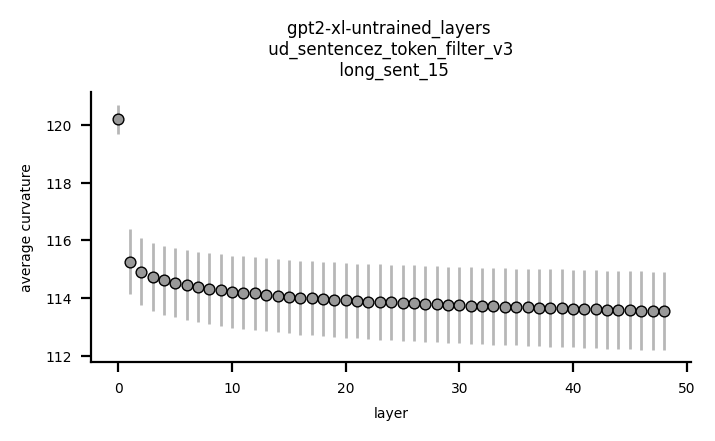

In [89]:
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
if bool(re.findall(r'-untrained', mdl_name)):
    line_cols=line_cols*0+(.6)
ax=plt.axes((.1,.1,.75,.45))
for i in range(len(all_layer_curve)):
    curv=all_layer_curve[i]
    ax.scatter(i,np.mean(curv)*180/np.pi,s=15,color=line_cols[i,:],zorder=2,edgecolor=(0,0,0),linewidth=.5,alpha=1)
    ax.errorbar(i,np.mean(curv)*180/np.pi,yerr=np.std(curv)*180/np.pi,linewidth=0,elinewidth=1, color=line_cols[i,:],zorder=0,alpha=.7)

    
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
     #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)#  
ax.set_ylabel('average curvature')
ax.set_xlabel('layer')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_title(f"{group} \n {dataset} \n long_sent_{long_k}")

#ax = fig.add_axes((.6,.1,.4,.4))
#ax.errorbar(np.arange(len(all_layer_curve_rnd)),np.mean(all_layer_curve_rnd,axis=1)*180/np.pi,yerr=np.std(all_layer_curve_rnd,axis=1)*180/np.pi,linewidth=2, color=(.5,.5,.5))

#ax.set_ylabel('average curvature')
# ax.set_xlabel('layer')
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.set_title(f"{group} \n {dataset} \n random shuffling")

#ax.set_ylim(y_pos.min()-1,y_pos.max()+1)
#ax.set_yticklabels(model_names,fontsize=14,fontweight='bold')
#ax.set_xlabel('score',fontsize=14)
#plt.xticks(fontsize=14)

fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_{group}_{dataset}_long_sent_{long_k}.pdf'),transparent=True)

In [21]:
len(all_layer_curve[1])

1595

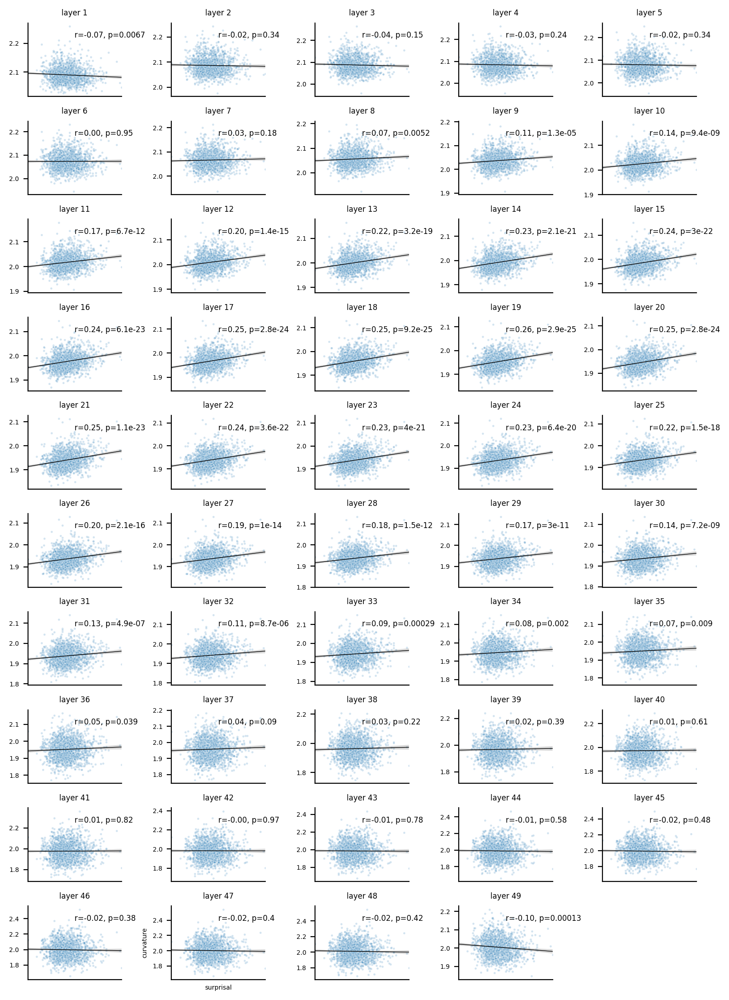

In [22]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(8,11),dpi=200,frameon=False)
long_surp=[tot_surprise_ave[x] for x in long_sent]
for i in range(len(all_layer_curve)):
    curv=all_layer_curve[i]

    ax=plt.subplot(10,5,i+1)
    #ax.scatter(tot_surprise_ave,curv,s=5,color=(0,0,1),zorder=4,edgecolor=(1,1,1),linewidth=.5,alpha=.5)
    ax = sns.regplot(x=long_surp, y=curv, scatter_kws={"s": 3,"alpha":.2,"edgecolor":(1,1,1),"linewidth":.5},line_kws={"lw":.5,'color':'k'})
    r, p = sp.stats.pearsonr(long_surp, curv)
    ax = plt.gca()
    ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes,fontsize=6)
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)#  
    #ax.set_yticks([])
    ax.set_title(f"layer {i+1}")
    #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
    ax.tick_params(
                    axis='both',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False) 
    if i==len(curve_change)-1:
        ax.set_xlabel('surprisal')
        ax.set_ylabel('curvature')
    
plt.tight_layout()
fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_vs_surprisal_{group}_{dataset}_long_sent_{long_k}.pdf'),transparent=True)

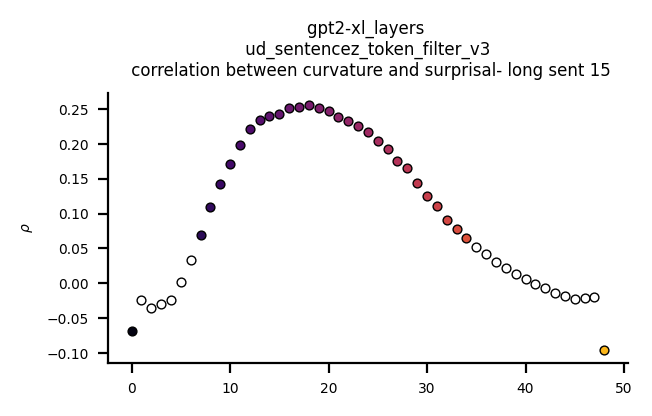

In [23]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
ax=plt.axes((.1,.1,.65,.45))
for i in range(len(all_layer_curve)):
    curv=all_layer_curve[i]
    r, p = sp.stats.pearsonr(long_surp, curv)
    #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
    #        transform=ax.transAxes,fontsize=6)
    if p<1e-2:
        ax.scatter(i,r,s=10,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5)
    else:
        ax.scatter(i,r,s=10,color=(1,1,1),zorder=4,edgecolor=(0,0,0),linewidth=.5)
    
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
     #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)#  
ax.set_ylabel(r'$\rho$')
ax.set_title(f"{group} \n {dataset} \n correlation between curvature and surprisal- long sent {long_k}")
fig.savefig(os.path.join(ANALYZE_DIR,f'correlation_curvature_vs_surprisal_{group}_{dataset}_long_sent_{long_k}.pdf'),transparent=True)

In [107]:
sent_layer_curve=[]
sent_surp=[]
sentence_length=np.unique(np.asarray([x.shape[0] for x in sent_act]))
for _, long_k in  tqdm(enumerate(sentence_length)):
    all_layer_curve=[]
    all_layer_curve_all=[]
    for layer_act in extractor_obj.model_group_act:
        sent_act_list=layer_act['activations']
        #sent_act=[torch.tensor(x[0], dtype=float, device=optim_obj.device, requires_grad=False) for x in sent_act_list]
        sent_act=[x[0] for x in sent_act_list]
        sent_str=[x[1] for x in sent_act_list]
        # longer sentences 
        long_sent=np.where(np.asarray([x.shape[0] for x in sent_act])==long_k)[0]
        long_surp=[tot_surprise_ave[x] for x in long_sent]
        sent_long=[sent_act[x] for x in long_sent]
        sent_long=[np.diff(x,axis=0) for x in sent_long]
        long_sent_str=[sent_str[x] for x in long_sent]
        sent_long=[normalized(x) for x in sent_long]
        curvature=[]
        for idy , vec in (enumerate(sent_long)):
            curve=[np.arccos(np.dot(vec[idx,:],vec[idx+1,:])) for idx in range(vec.shape[0]-1)]
            curvature.append(curve)
        all_layer_curve.append([np.mean(x) for x in curvature])
        all_layer_curve_all.append(curvature)
    sent_layer_curve.append(all_layer_curve)
    sent_surp.append(long_surp)

5it [00:24,  4.91s/it]


KeyboardInterrupt: 

In [104]:
sentence_length

array([ 4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17])

ValueError: x and y must have length at least 2.

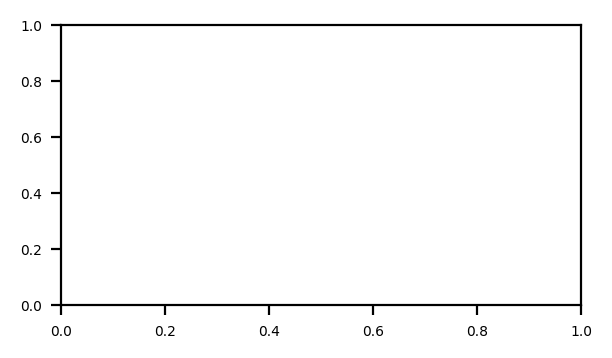

In [105]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(4,4),dpi=200,frameon=False)
num_colors=len(sent_surp)+2
color_fact=num_colors+2
h0=cm.get_cmap('viridis',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
ax=plt.axes((.1,.1,.65,.35))
r_image=[]
for k in range(len(sent_layer_curve)):
    all_layer_curve=sent_layer_curve[k]
    long_surp=sent_surp[k]
    r_line=[]
    for i in range(len(all_layer_curve)):
        curv=all_layer_curve[i]
        r, p = sp.stats.pearsonr(long_surp, curv)
        #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
        #        transform=ax.transAxes,fontsize=6)
        if p<1e-2:
            ax.scatter(i,r,s=5,color=line_cols[k,:],zorder=4,edgecolor=(0,0,0),linewidth=.5)
        else:
            ax.scatter(i,r,s=5,color=(1,1,1),zorder=4,edgecolor=(0,0,0),linewidth=.5)
        r_line.append(r)
    ax.plot(np.arange(len(r_line)),r_line,color=line_cols[k,:],linewidth=1,label=f'length: {sentence_length[k]}')
    r_image.append(r_line)
       # m, b = np.polyfit(tot_surprise_ave, curv, 1)
        #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
        #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
         #ax.tick_params(
    #                     axis='x',          # changes apply to the x-axis
    #                     which='both',      # both major and minor ticks are affected
    #                     bottom=False,      # ticks along the bottom edge are off
    #                     top=False,         # ticks along the top edge are off
    #                     labelbottom=False) 
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)#  
ax.set_ylabel(r'$\rho$')
ax.set_xlabel('layer')
ax.legend(bbox_to_anchor=(1.1, 1.05))
#ax.autoscale(enable=True, axis='x', tight=True)
ax.autoscale(enable=True, axis='y', tight=False)
ax.set_xlim((-.5,len(r_image[1])+.5))
#
ax=plt.axes((.1,.5,.65,.45))

image = ax.imshow(np.stack(r_image),vmin=-.15,vmax=.4,cmap=plt.get_cmap('inferno'),origin='lower',extent=[1,len(r_image[1]),min(sentence_length),max(sentence_length)],aspect='auto')
ax.set_xticks([])

ax.axes.yaxis.set_ticks(np.linspace(ax.get_ylim()[0]+.5,ax.get_ylim()[1]-.5,len(sentence_length),endpoint=True))
ax.axes.yaxis.set_ticklabels(sentence_length,fontsize=4)
ax.set_ylabel('Sentence length')
ax.set_title(f"{group} \n {dataset} \n correlation between curvature and surprisal_ diff sent length")
fig.savefig(os.path.join(ANALYZE_DIR,f'correlation_curvature_vs_surprisal_{group}_{dataset}_diff sent length.pdf'),transparent=True)

# layer based 

In [29]:
surp_len=[len(x['surprisal_3']) for x in extractor_obj.data_]

all_layer_curve=[]
all_layer_curve_all=[]

for _,layer_act in tqdm_notebook(enumerate(extractor_obj.model_group_act)):
    sent_act_list=layer_act['activations']
    act_length=[x[0].shape[0] for x in sent_act_list]
    sent_act=[x[0] for x in sent_act_list]
    sent_str=[x[1] for x in sent_act_list]
    # longer sentences 
    long_sent=np.where(np.asarray(act_length)==np.asarray(surp_len))[0]
    sent_long_act=[sent_act[x] for x in long_sent]
    sent_long=[np.diff(x,axis=0) for x in sent_long_act]
    long_sent_str=[sent_str[x] for x in long_sent]
    sent_long=[normalized(x) for x in sent_long]
    curvature=[]
    for idy , vec in (enumerate(sent_long)):
        curve=[np.arccos(np.dot(vec[idx,:],vec[idx+1,:])) for idx in range(vec.shape[0]-1)]
        curvature.append(curve)
    all_layer_curve.append([np.mean(x) for x in curvature])
    all_layer_curve_all.append(curvature)
    




/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


0it [00:00, ?it/s]

In [52]:
# look from word 2 to n surprisal 
tot_surprise_match=[tot_surprise[x] for x in long_sent]
tot_surp_2_to_n=[x[2:] for x in tot_surprise_match]
tot_surp_1_to_n_1=[x[1:-1] for x in tot_surprise_match]

In [56]:
# look from word 2 to n surprisal 
tot_surprise_match=[tot_surprise[x] for x in long_sent]
tot_surp_2_to_n=[x[2:] for x in tot_surprise_match]
tot_surp_1_to_n_1=[x[1:-1] for x in tot_surprise_match]
layer_corr_2_n=[]
layer_corr_1_n_1=[]
for _, curvature in tqdm_notebook(enumerate(all_layer_curve_all)):
    word_corr=[]
    word_corr_1=[]
    for idx, x in enumerate(tot_surp_2_to_n):
        u, v,w = pd.Series(curvature[idx]), pd.Series(x), pd.Series(tot_surp_1_to_n_1[idx])
        word_corr.append(u.corr(v))
        word_corr_1.append(u.corr(w))
    # 
    layer_corr_2_n.append(word_corr)
    layer_corr_1_n_1.append(word_corr_1)


/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


0it [00:00, ?it/s]

/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2551: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2480: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


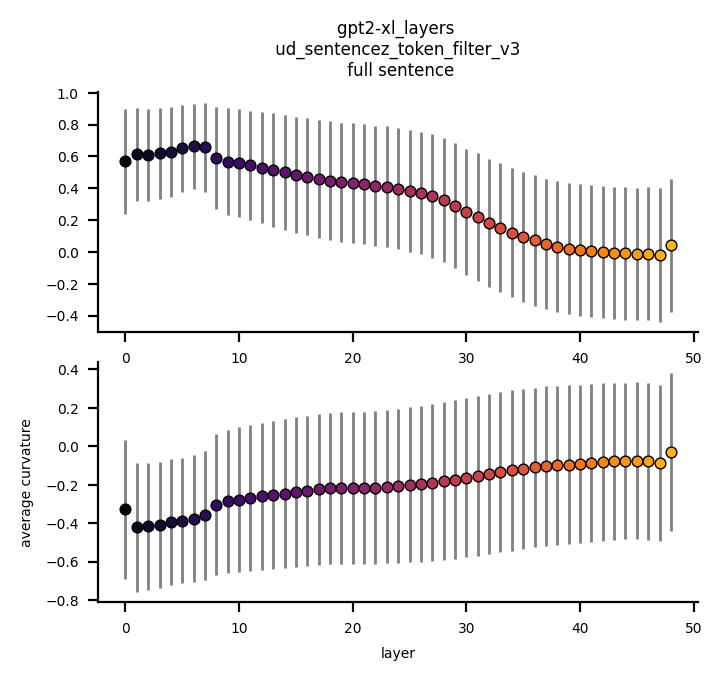

In [66]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
ax=plt.axes((.1,.1,.75,.4))

ax.errorbar(np.arange(len(layer_corr_2_n)),np.nanmean(np.stack(layer_corr_2_n),axis=1),yerr=np.nanstd(np.stack(layer_corr_2_n),axis=1),linewidth=0,elinewidth=1, color=(.5,.5,.5))


for i in range(len(layer_corr_2_n)):
    curv=layer_corr_2_n[i]
    ax.scatter(i,np.nanmean(curv),s=15,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5)

    
#ax.scatter(np.arange(len(layer_corr)),np.mean(np.stack(all_layer_curve),axis=1),s=25,color=(0,0,1),zorder=4,edgecolor=(0,0,0),linewidth=.5)

ax.set_ylabel('average curvature')
ax.set_xlabel('layer')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)



ax=plt.axes((.1,.55,.75,.4))

ax.errorbar(np.arange(len(layer_corr_1_n_1)),np.nanmean(np.stack(layer_corr_1_n_1),axis=1),yerr=np.nanstd(np.stack(layer_corr_1_n_1),axis=1),linewidth=0,elinewidth=1, color=(.5,.5,.5))


for i in range(len(layer_corr_1_n_1)):
    curv=layer_corr_1_n_1[i]
    ax.scatter(i,np.nanmean(curv),s=15,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.set_title(f"{group} \n {dataset} \n full sentence")

#ax = fig.add_axes((.6,.1,.4,.4))
#ax.errorbar(np.arange(len(all_layer_curve_rnd)),np.mean(all_layer_curve_rnd,axis=1)*180/np.pi,yerr=np.std(all_layer_curve_rnd,axis=1)*180/np.pi,linewidth=2, color=(.5,.5,.5))

#ax.set_ylabel('average curvature')
# ax.set_xlabel('layer')
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.set_title(f"{group} \n {dataset} \n random shuffling")

#ax.set_ylim(y_pos.min()-1,y_pos.max()+1)
#ax.set_yticklabels(model_names,fontsize=14,fontweight='bold')
#ax.set_xlabel('score',fontsize=14)
#plt.xticks(fontsize=14)

fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_vs_surprisal_wordlevel_2_n.pdf'),transparent=True)

In [71]:
# look from word 2 to n surprisal 
tot_surprise_match=[tot_surprise[x] for x in long_sent]
tot_surp_2_to_n=[x[2:] for x in tot_surprise_match]
tot_surp_1_to_n_1=[x[1:-1] for x in tot_surprise_match]
tot_surp_2_to_n_flat = [item for sublist in tot_surp_2_to_n for item in sublist]
tot_surp_1_to_n_1_flat = [item for sublist in tot_surp_1_to_n_1 for item in sublist]
all_layer_curv_flat=[]
for _, curvature in tqdm_notebook(enumerate(all_layer_curve_all)):
    curv_flat=[item for sublist in curvature for item in sublist]
    all_layer_curv_flat.append(curv_flat)

/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


0it [00:00, ?it/s]

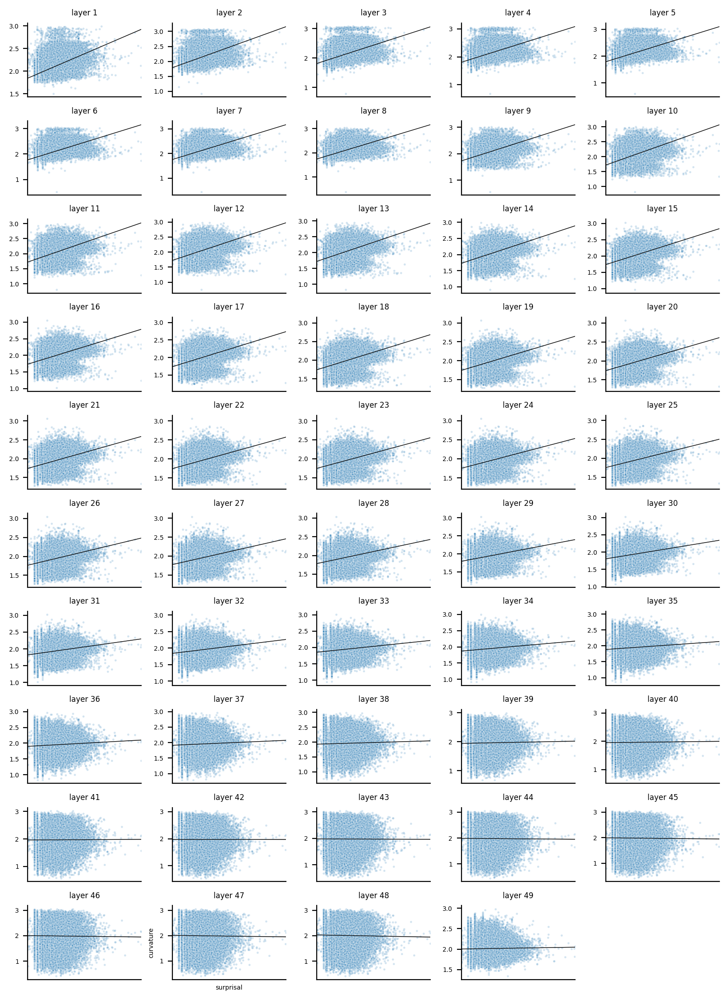

In [73]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(8,11),dpi=200,frameon=False)
long_surp=[tot_surprise_ave[x] for x in long_sent]
for i in range(len(all_layer_curv_flat)):
    curv=all_layer_curv_flat[i]

    ax=plt.subplot(10,5,i+1)
    #ax.scatter(tot_surprise_ave,curv,s=5,color=(0,0,1),zorder=4,edgecolor=(1,1,1),linewidth=.5,alpha=.5)
    ax = sns.regplot(x=tot_surp_1_to_n_1_flat, y=curv, scatter_kws={"s": 3,"alpha":.2,"edgecolor":(1,1,1),"linewidth":.5},line_kws={"lw":.5,'color':'k'})
    #r, p = sp.stats.pearsonr(long_surp, curv)
    #ax = plt.gca()
    #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
    #        transform=ax.transAxes,fontsize=6)
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)#  
    #ax.set_yticks([])
    ax.set_title(f"layer {i+1}")
    #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
    ax.tick_params(
                    axis='both',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False) 
    if i==len(curve_change)-1:
        ax.set_xlabel('surprisal')
        ax.set_ylabel('curvature')
    
plt.tight_layout()
#fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_vs_surprisal_{group}_{dataset}_long_sent_{long_k}.pdf'),transparent=True)

# get pcfg suprisal

In [11]:
pcfg_surp=pd.read_csv('/om/user/ehoseini/MyData/Universal Dependencies 2.6/from_Cory/UD.pcfgsurp.items.csv')

In [42]:
pcfg_surp

,word,totsurp,rolled,sentid,sentpos
0,[This,31.24730,1.0,1,1
1,killing,15.47630,0.0,1,2
2,of,2.63744,0.0,1,3
3,a,5.55040,0.0,1,4
4,respected,16.51030,0.0,1,5
...,...,...,...,...,...
69199,and,5.32493,0.0,7014,7
69200,a,4.85548,0.0,7014,8
69201,very,12.38120,0.0,7014,9
69202,knowledgeable,16.85200,0.0,7014,10


2497

In [43]:
all_pcfg_sent=[]
all_pcfg_vals=[]
for k in pcfg_surp.sentid.unique():
    pcfg_sent=' '.join(list(pcfg_surp.word[pcfg_surp.sentid==k]))
    pcfg_val=list(pcfg_surp.totsurp[pcfg_surp.sentid==k])
    all_pcfg_sent.append(pcfg_sent)
    all_pcfg_vals.append(pcfg_val)

In [96]:
overlap=0
all_overlap=[]
all_pcfg_overlap=[[np.nan]]*len(tot_sent_with_period)
for idx,pcfg_sent in enumerate(all_pcfg_sent):
    try:
        overlap_loc=tot_sent_with_period.index(pcfg_sent)
        all_overlap.append(overlap_loc)
        all_pcfg_overlap[overlap_loc]=all_pcfg_vals[idx]
        overlap=overlap+1
    except ValueError:
        pass

2576

In [194]:
all_layer_curve=[]
all_layer_curve_all=[]
all_layer_curve_rnd=[]
all_layer_curve_rnd_all=[]
for idk,layer_act in  tqdm_notebook(enumerate(extractor_obj.model_group_act)):
    sent_act_list=layer_act['activations']
    #sent_act=[torch.tensor(x[0], dtype=float, device=optim_obj.device, requires_grad=False) for x in sent_act_list]
    sent_act=[x[0] for x in sent_act_list]
    sent_act=[np.diff(x,axis=0) for x in sent_act]
    
    sent_act=[normalized(x) for x in sent_act]
    curvature=[]
    for idy , vec in (enumerate(sent_act)):
        curve=[np.dot(vec[idx,:],vec[idx+1,:]) for idx in range(vec.shape[0]-1)]
        curvature.append(np.arccos(curve))
    all_layer_curve.append([np.mean(x[:-1]) for x in curvature])
    all_layer_curve_all.append(curvature)

/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


0it [00:00, ?it/s]

In [202]:
all_pcfg_overlap_ave=np.asarray([np.nanmean(np.asarray(x[1:-1])) for x in all_pcfg_overlap])
#all_pcfg_overlap_ave=np.asarray([x[-1] for x in all_pcfg_overlap])
where_to_look=np.argwhere(~np.isnan(all_pcfg_overlap_ave))


/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.


2509

In [ ]:
import matplotlib
matplotlib.rcParams['font.size'] = 10
fig=plt.figure(figsize=(26,14),dpi=75,frameon=False)
curve_change=list(np.stack(all_layer_curve)[1:-1,:]-np.stack(all_layer_curve)[1,:])
for i in range(len(curve_change)):
    curv=curve_change[i][where_to_look]
    ax=plt.subplot(7,7,i+1)
    #ax.scatter(tot_surprise_ave,curv,s=5,color=(0,0,1),zorder=4,edgecolor=(1,1,1),linewidth=.5,alpha=.5)
    ax = sns.regplot(x=all_pcfg_overlap_ave[where_to_look], y=curv, scatter_kws={"s": 3,"alpha":.2,"edgecolor":(1,1,1),"linewidth":.5},line_kws={"lw":2,'color':'k'})
    r, p = sp.stats.pearsonr(np.squeeze(all_pcfg_overlap_ave[where_to_look]), np.squeeze(curv))
    ax = plt.gca()
    ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes,fontsize=10)
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)#  
    ax.set_yticks([])
    ax.set_title(f"layer {i+1}")
    #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
    ax.tick_params(
                    axis='both',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False) 
    if i==len(curve_change)-1:
        ax.set_xlabel('surprisal')
        ax.set_ylabel('curvature change')
    
plt.tight_layout()
#fig.savefig(os.path.join(ANALYZE_DIR,f'curvature_chang_vs_surprisal_{group}_{dataset}.pdf'),transparent=True)

In [ ]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
if bool(re.findall(r'-untrained', mdl_name)):
    line_cols=line_cols*0+(.6)
ax=plt.axes((.1,.1,.65,.45))
for i in range(len(all_layer_curve)):
    curv=np.asarray(all_layer_curve[i])[where_to_look]
    r, p = sp.stats.pearsonr(np.squeeze(all_pcfg_overlap_ave[where_to_look]), np.squeeze(curv))
    #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
    #        transform=ax.transAxes,fontsize=6)
    if p<1e-2:
        ax.scatter(i,r,s=10,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5,alpha=1)
    else:
        ax.scatter(i,r,s=10,color=(1,1,1),zorder=4,edgecolor=(0,0,0),linewidth=.5)
    
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
     #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False)
#ax.set_ylim((-.06,.21))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)#  
ax.set_ylabel(r'$\rho$')
ax.set_title(f"{group} \n {dataset} \n correlation between curvature and pcfg surprisal")
#fig.savefig(os.path.join(ANALYZE_DIR,f'correlation_curvature_vs_surprisal_{group}_{dataset}.pdf'),transparent=True)

In [ ]:
all_layer_curv_flat=[]
for _, curvature in tqdm_notebook(enumerate(all_layer_curve_all)):
    curv_pcfg=[curvature[int(x)] for x in where_to_look]
    curv_flat=[item for sublist in curv_pcfg for item in sublist]
    all_layer_curv_flat.append(curv_flat)

In [152]:
len(curv_flat)

21036

In [162]:
pcfg_=[all_pcfg_overlap[int(x)] for x in where_to_look]
pfcg_surp_2_to_n=[x[1:-1] for x in pcfg_]
pcfg_flat=[item for sublist in pfcg_surp_2_to_n for item in sublist]

21036

In [ ]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(8,11),dpi=200,frameon=False)

for i in range(len(all_layer_curv_flat)):
    curv=all_layer_curv_flat[i]
    ax=plt.subplot(10,5,i+1)
    #ax.scatter(tot_surprise_ave,curv,s=5,color=(0,0,1),zorder=4,edgecolor=(1,1,1),linewidth=.5,alpha=.5)
    ax = sns.regplot(x=pcfg_flat, y=curv, scatter_kws={"s": 3,"alpha":.2,"edgecolor":(1,1,1),"linewidth":.5},line_kws={"lw":.5,'color':'k'})
    #r, p = sp.stats.pearsonr(long_surp, curv)
    #ax = plt.gca()
    #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
    #        transform=ax.transAxes,fontsize=6)
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)#  
    #ax.set_yticks([])
    ax.set_title(f"layer {i+1}")
    #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
#     ax.tick_params(
#                     axis='both',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) 
    if i==len(curve_change)-1:
        ax.set_xlabel('surprisal')
        ax.set_ylabel('curvature')
plt.tight_layout()

# 5 words suprisal 

In [24]:
fwprob5_surp=pd.read_csv('/om/user/ehoseini/MyData/Universal Dependencies 2.6/from_Cory/UD.lexsurp.corrected.items.csv')
lex_surp=pd.read_csv('/om/user/ehoseini/MyData/Universal Dependencies 2.6/from_Cory/UD.lexsurp.corrected.items.csv')


In [25]:
all_fwprob5_sent=[]
all_fwprob5_vals=[]
for k in fwprob5_surp.sentid.unique():
    try:
        list(fwprob5_surp.word[fwprob5_surp.sentid==k]).index(np.nan)
    except ValueError:
        fwprob5_sent=' '.join(list(fwprob5_surp.word[fwprob5_surp.sentid==k]))
        fwprob5_val=list(fwprob5_surp.fwprob5[fwprob5_surp.sentid==k])
        all_fwprob5_sent.append(fwprob5_sent)
        all_fwprob5_vals.append(fwprob5_val)

In [26]:
all_lex_sent=[]
all_lex_vals=[]
for k in lex_surp.sentid.unique():
    try:
        list(lex_surp.word[lex_surp.sentid==k]).index(np.nan)
    except ValueError:
        lex_sent=' '.join(list(lex_surp.word[lex_surp.sentid==k]))
        lex_val=list(lex_surp.unigramsurp[lex_surp.sentid==k])
        all_lex_sent.append(lex_sent)
        all_lex_vals.append(lex_val)

In [27]:
overlap=0
all_overlap=[]
all_fwprob5_overlap=[[np.nan]]*len(tot_sent_with_period)
all_3surp_overlap=[[np.nan]]*len(tot_sent_with_period)
all_lex_overlap=[[np.nan]]*len(tot_sent_with_period)
for idx,fwprob5_sent in enumerate(all_fwprob5_sent):
    try:
        overlap_loc=tot_sent_with_period.index(fwprob5_sent)
        all_overlap.append(overlap_loc)
        all_fwprob5_overlap[overlap_loc]=all_fwprob5_vals[idx]
        all_lex_overlap[overlap_loc]=all_lex_vals[idx]
        all_3surp_overlap[overlap_loc]=tot_surprise[overlap_loc]
        overlap=overlap+1
    except ValueError:
        pass

In [36]:
all_layer_curve=[]
all_layer_curve_all=[]
all_layer_curve_rnd=[]
all_layer_curve_rnd_all=[]
for idk,layer_act in  tqdm_notebook(enumerate(extractor_obj.model_group_act)):
    sent_act_list=layer_act['activations']
    #sent_act=[torch.tensor(x[0], dtype=float, device=optim_obj.device, requires_grad=False) for x in sent_act_list]
    sent_act=[x[0] for x in sent_act_list]
    sent_act=[np.diff(x,axis=0) for x in sent_act]
    
    sent_act=[normalized(x) for x in sent_act]
    curvature=[]
    for idy , vec in (enumerate(sent_act)):
        curve=[np.dot(vec[idx,:],vec[idx+1,:]) for idx in range(vec.shape[0]-1)]
        curvature.append(np.arccos(curve))
    all_layer_curve.append([np.mean(x) for x in curvature])
    all_layer_curve_all.append(curvature)

/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


0it [00:00, ?it/s]

In [35]:
all_fwprob5_overlap_ave=np.asarray([np.nanmean(np.asarray(x[1:-1])) for x in all_fwprob5_overlap])
all_3surp_overlap_ave=np.asarray([np.nanmean(np.asarray(x[1:-1])) for x in all_3surp_overlap])
all_lex_overlap_ave=np.asarray([np.nanmean(np.asarray(x[1:-1])) for x in all_lex_overlap])
#all_pcfg_overlap_ave=np.asarray([x[-1] for x in all_pcfg_overlap])
where_to_look=np.argwhere(~np.isnan(all_fwprob5_overlap_ave))



/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.
/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/om/user/ehoseini/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 1.0, 'gpt2-xl_layers \n ud_sentencez_token_filter_v3 \n correlation between curvature and fwprob5 surprisal')

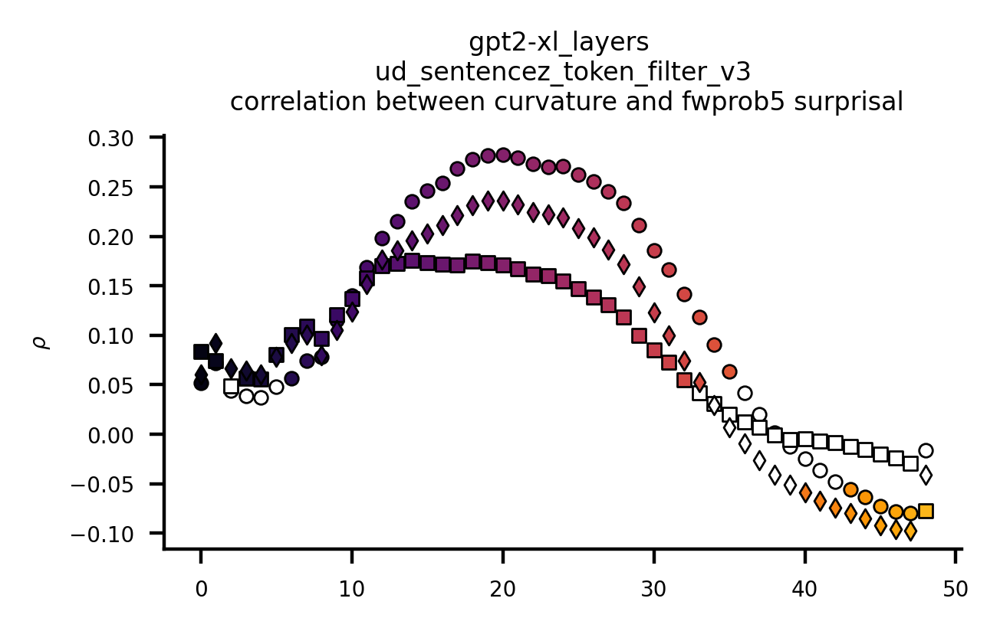

In [37]:
import matplotlib
matplotlib.rcParams['font.size'] = 5
fig=plt.figure(figsize=(4,3),dpi=200,frameon=False)
num_colors=len(all_layer_curve)+2
color_fact=num_colors+10
h0=cm.get_cmap('inferno',color_fact)
line_cols=(h0(np.arange(color_fact)/color_fact))
line_cols=line_cols[2:,:]
if bool(re.findall(r'-untrained', mdl_name)):
    line_cols=line_cols*0+(.6)
ax=plt.axes((.1,.1,.65,.45))
for i in range(len(all_layer_curve)):
    curv=np.asarray(all_layer_curve[i])[where_to_look]
    r, p = sp.stats.pearsonr(-1*np.squeeze(all_fwprob5_overlap_ave[where_to_look]), np.squeeze(curv))
    #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
    #        transform=ax.transAxes,fontsize=6)
    if p<1e-2:
        ax.scatter(i,r,s=10,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5,alpha=1)
    else:
        ax.scatter(i,r,s=10,color=(1,1,1),zorder=4,edgecolor=(0,0,0),linewidth=.5)
    # 3 word surprisal     
    # 
    r, p = sp.stats.pearsonr(np.squeeze(all_3surp_overlap_ave[where_to_look]), np.squeeze(curv))
    #ax.text(.5, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
    #        transform=ax.transAxes,fontsize=6)
    if p<1e-2:
        ax.scatter(i,r,s=10,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5,alpha=1,marker='s')
    else:
        ax.scatter(i,r,s=10,color=(1,1,1),zorder=4,edgecolor=(0,0,0),linewidth=.5,marker='s')
        
    #
    r, p = sp.stats.pearsonr(np.squeeze(all_lex_overlap_ave[where_to_look]), np.squeeze(curv))
    if p<1e-2:
        ax.scatter(i,r,s=10,color=line_cols[i,:],zorder=4,edgecolor=(0,0,0),linewidth=.5,alpha=1,marker='d')
    else:
        ax.scatter(i,r,s=10,color=(1,1,1),zorder=4,edgecolor=(0,0,0),linewidth=.5,marker='d')
    
   # m, b = np.polyfit(tot_surprise_ave, curv, 1)
    #X_plot = np.linspace(ax.get_xlim()[0],ax.get_xlim()[1],100)
    #plt.plot(X_plot, m*X_plot + b, 'k-',zorder=4)
     #ax.tick_params(
#                     axis='x',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False)
#ax.set_ylim((-.06,.21))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)#  
ax.set_ylabel(r'$\rho$')
ax.set_title(f"{group} \n {dataset} \n correlation between curvature and fwprob5 surprisal")
#fig.savefig(os.path.join(ANALYZE_DIR,f'correlation_curvature_vs_surprisal_{group}_{dataset}.pdf'),transparent=True)